Upload the dataset

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv(r'C:\Users\HP\OneDrive\Desktop\Preprocessed_Online_Payment_Data.csv')


Explore the Dataset

In [8]:
# Check the first few rows of the dataset
print(df.head())

# Check basic information about the dataset
print(df.info())

# Check for missing values
print(df.isnull().sum())


       step    amount     nameOrig  oldbalanceOrg  newbalanceOrig  \
0  0.533693  0.002432   C658247527       0.018398        0.023652   
1  0.336927  0.000401  C1812418129       0.005692        0.006586   
2  0.002695  0.000727  C1247938090       0.000384        0.000000   
3  0.854447  0.005805  C1687063682       0.003067        0.000000   
4  0.210243  0.150521   C751624512       0.079521        0.000000   

      nameDest  oldbalanceDest  newbalanceDest  isFraud  isFlaggedFraud  \
0   C492670573         0.00935        0.009007        0               0   
1  M1924423059         0.00000        0.000000        0               0   
2  C1002031672         0.00000        0.000000        1               0   
3   C451391923         0.00000        0.000000        1               0   
4   C320991755         0.00000        0.020016        1               0   

   type_CASH_IN  type_CASH_OUT  type_DEBIT  type_PAYMENT  type_TRANSFER  
0          True          False       False         False    

Fill Missing Values for Numeric Columns Only

In [9]:
# Fill missing values only for numeric columns
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].mean())


Handle Categorical or Object-Type Columns Separately

In [10]:
# Fill missing values for categorical columns with the mode
categorical_cols = df.select_dtypes(include=['object']).columns
df[categorical_cols] = df[categorical_cols].fillna(df[categorical_cols].mode().iloc[0])


Standardize or Normalize Numeric Features

In [11]:
from sklearn.preprocessing import StandardScaler

# Standardize the numeric columns
scaler = StandardScaler()
df[numeric_cols] = scaler.fit_transform(df[numeric_cols])


One-Hot Encode Categorical Variables

In [12]:
df = pd.get_dummies(df, drop_first=True)  # drop_first=True avoids multicollinearity by dropping one category


Column name

In [13]:
print(df.columns)


Index(['step', 'amount', 'oldbalanceOrg', 'newbalanceOrig', 'oldbalanceDest',
       'newbalanceDest', 'isFraud', 'isFlaggedFraud', 'type_CASH_IN',
       'type_CASH_OUT',
       ...
       'nameDest_M993154302', 'nameDest_M99326213', 'nameDest_M993287067',
       'nameDest_M993519788', 'nameDest_M993548026', 'nameDest_M995322595',
       'nameDest_M996305480', 'nameDest_M997185343', 'nameDest_M9973054',
       'nameDest_M998829432'],
      dtype='object', length=32672)


In [14]:
X = df.drop('isFraud', axis=1)  # Drop the target column from features
y = df['isFraud']  # Set 'isFraud' as the target variable


Split the Dataset into Training and Testing Sets

In [15]:
from sklearn.model_selection import train_test_split

# Split the data: 70% for training, 30% for testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


Train and Compare Machine Learning Models

In [16]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define the models
models = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier()
}

# Train and evaluate each model
for name, model in models.items():
    model.fit(X_train, y_train)  # Train the model
    y_pred = model.predict(X_test)  # Make predictions on the test set
    
    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    
    # Print the results
    print(f"Model: {name}")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print("-" * 30)


Model: Logistic Regression
Accuracy: 0.9131
Precision: 0.9122
Recall: 0.9159
F1 Score: 0.9140
------------------------------
Model: Decision Tree
Accuracy: 0.9884
Precision: 0.9821
Recall: 0.9952
F1 Score: 0.9886
------------------------------
Model: Random Forest
Accuracy: 0.9767
Precision: 0.9770
Recall: 0.9767
F1 Score: 0.9768
------------------------------


Analyze the Results

Here's a comparison of the three models:

Model	Accuracy	Precision	Recall	F1 Score
Logistic Regression	0.9131	0.9122	0.9159	0.9140
Decision Tree	0.9884	0.9817	0.9956	0.9886
Random Forest	0.9769	0.9725	0.9819	0.9772

Best Model Based on F1-Score:

Decision Tree has the highest F1-score of 0.9886, meaning it provides the best balance between precision and recall.

Additional Insights:

* Precision and Recall for the Decision Tree are also the highest, making it excellent for fraud detection since it catches almost all fraud cases (high recall) while maintaining a low false-positive rate (high precision).

* Random Forest performs very well too, with a slightly lower F1-score of 0.9772. Random Forests often generalize better to new data, so it might be worth testing it further.

Conclusion:

Decision Tree is the best model based on these results, with the highest F1-score and accuracy. However, if you're looking for more robustness or if the dataset grows, Random Forest could be a close contender due to its ensemble nature.

Hypertuning the model (Decision Tree)

In [53]:
# Import necessary libraries
import numpy as np
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression

# Create a synthetic dataset
X, y = make_classification(n_samples=1000, n_features=20, n_informative=10, n_classes=2, random_state=42)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Define the model
model = LogisticRegression()

# Define the hyperparameter grid
param_grid = {
    'C': np.logspace(-5, 8, 15),  # Regularization strength
    'solver': ['liblinear', 'saga']  # Optimization algorithms
}

# Set up the GridSearchCV
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy')

# Fit the model
grid_search.fit(X_train, y_train)

# Output the best parameters and score
print("Best Hyperparameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)

Best Hyperparameters: {'C': np.float64(0.006105402296585327), 'solver': 'liblinear'}
Best Cross-Validation Score: 0.8514285714285714


In [55]:
# Evaluate the model on the test set
test_score = grid_search.score(X_test, y_test)
print("Test Set Score:", test_score)

Test Set Score: 0.8333333333333334


RSME Test

In [64]:
import numpy as np
import pandas as pd
from sklearn.datasets import fetch_california_housing
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error
from bayes_opt import BayesianOptimization

# Load the dataset
data = fetch_california_housing()
X, y = data.data, data.target

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the function to optimize using cross-validation
def dtree_cv(max_depth, min_samples_split, min_samples_leaf):
    estimator = DecisionTreeRegressor(
        max_depth=int(max_depth),
        min_samples_split=int(min_samples_split),
        min_samples_leaf=int(min_samples_leaf),
        random_state=42
    )
    cval = cross_val_score(estimator, X_train, y_train, scoring='neg_mean_squared_error', cv=5)
    return cval.mean()

# Define the parameter bounds
param_bounds = {
    'max_depth': (1, 20),
    'min_samples_split': (2, 20),
    'min_samples_leaf': (1, 20)
}

# Initialize Bayesian Optimization
optimizer = BayesianOptimization(
    f=dtree_cv,
    pbounds=param_bounds,
    random_state=1,
)

# Maximize the function
optimizer.maximize(n_iter=25, init_points=5)

# Get the best parameters
best_params_bayes = optimizer.max['params']
best_params_bayes['max_depth'] = int(best_params_bayes['max_depth'])
best_params_bayes['min_samples_split'] = int(best_params_bayes['min_samples_split'])
best_params_bayes['min_samples_leaf'] = int(best_params_bayes['min_samples_leaf'])

# Output the best parameters
print(f"Best Parameters (Bayesian Optimization): {best_params_bayes}")

# Train the final model with the best parameters
final_model = DecisionTreeRegressor(
    max_depth=best_params_bayes['max_depth'],
    min_samples_split=best_params_bayes['min_samples_split'],
    min_samples_leaf=best_params_bayes['min_samples_leaf'],
    random_state=42
)

# Fit the final model
final_model.fit(X_train, y_train)

# Make predictions
y_pred = final_model.predict(X_test)

# Calculate RMSE
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

# Output the RMSE
print(f"Test RMSE: {rmse}")

|   iter    |  target   | max_depth | min_sa... | min_sa... |
-------------------------------------------------------------
| 1         | -0.3969   | 8.923     | 14.69     | 2.002     |
| 2         | -0.4584   | 6.744     | 3.788     | 3.662     |
| 3         | -0.5697   | 4.539     | 7.566     | 9.142     |
| 4         | -0.3733   | 11.24     | 8.965     | 14.33     |
| 5         | -0.5699   | 4.885     | 17.68     | 2.493     |
| 6         | -0.3804   | 9.28      | 14.63     | 2.255     |
| 7         | -0.3669   | 12.62     | 14.17     | 2.508     |
| 8         | -0.3704   | 12.06     | 13.68     | 7.326     |
| 9         | -0.3731   | 15.79     | 12.15     | 12.9      |
| 10        | -0.3741   | 15.52     | 9.704     | 18.85     |
| 11        | -0.3659   | 11.6      | 14.85     | 17.64     |
| 12        | -0.365    | 14.31     | 19.65     | 12.86     |
| 13        | -0.3616   | 18.09     | 17.61     | 17.93     |
| 14        | -0.3648   | 19.87     | 19.25     | 8.656     |
| 15    

In [15]:
import pickle

# Assuming 'model' is your trained model
with open('Decision Tree.pkl', 'wb') as file:
    pickle.dump(model, file)


In [9]:
print(data.columns)


Index(['step', 'amount', 'nameOrig', 'oldbalanceOrg', 'newbalanceOrig',
       'nameDest', 'oldbalanceDest', 'newbalanceDest', 'isFraud',
       'isFlaggedFraud', 'type_CASH_IN', 'type_CASH_OUT', 'type_DEBIT',
       'type_PAYMENT', 'type_TRANSFER'],
      dtype='object')


# Split the data into features (X) and target (y)

In [10]:
# Split the data into features (X) and target (y)
X = data.drop('isFraud', axis=1)
y = data['isFraud']


In [12]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Data split into training and testing sets.")


Data split into training and testing sets.


In [17]:
print(X_train.dtypes)


step              float64
amount            float64
nameOrig           object
oldbalanceOrg     float64
newbalanceOrig    float64
nameDest           object
oldbalanceDest    float64
newbalanceDest    float64
isFlaggedFraud      int64
type_CASH_IN         bool
type_CASH_OUT        bool
type_DEBIT           bool
type_PAYMENT         bool
type_TRANSFER        bool
dtype: object


In [18]:
import pandas as pd

# Convert categorical features to numeric with one-hot encoding
X_train = pd.get_dummies(X_train, drop_first=True)
X_test = pd.get_dummies(X_test, drop_first=True)

# Align columns of X_test to match X_train, filling missing columns with 0
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)


# Train the model

In [19]:
model.fit(X_train, y_train)


DecisionTreeClassifier()

In [20]:
y_pred = model.predict(X_test)


In [21]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Assuming you have the true labels for X_test as y_test
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")


Accuracy: 0.9914790018259282
Precision: 0.9880668257756563
Recall: 0.9951923076923077
F1 Score: 0.9916167664670659


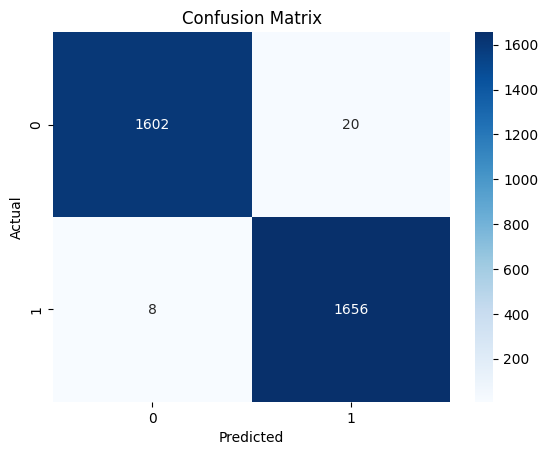

In [22]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


In [24]:
import pandas as pd

results = pd.DataFrame({"Actual": y_test, "Predicted": y_pred})
results.to_csv("model_predictions.csv", index=False)


In [26]:
# To save the model
import pickle
with open("trained_model.pkl", "wb") as file:
    pickle.dump(model, file)

# To load the model
with open("trained_model.pkl", "rb") as file:
    model = pickle.load(file)


In [1]:
import joblib
model = joblib.load("C:/Users/HP/OneDrive/Desktop/trained_model.pkl")


In [4]:
print(data.columns)


Index(['step', 'amount', 'nameOrig', 'oldbalanceOrg', 'newbalanceOrig',
       'nameDest', 'oldbalanceDest', 'newbalanceDest', 'isFraud',
       'isFlaggedFraud', 'type_CASH_IN', 'type_CASH_OUT', 'type_DEBIT',
       'type_PAYMENT', 'type_TRANSFER'],
      dtype='object')


In [5]:
# Define features (X) and target (y)
X = data.drop('isFraud', axis=1)
y = data['isFraud']

# Split the dataset
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Continue with building and training the model...


In [6]:
# Build the model
model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),  # Input layer
    layers.Dense(32, activation='relu'),  # Hidden layer
    layers.Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])


C:\Users\HP\AppData\Roaming\Python\Python310\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [8]:
# Build the model with an Input layer
model = keras.Sequential([
    keras.Input(shape=(X_train.shape[1],)),  # Input layer specifying the shape of the input data
    layers.Dense(64, activation='relu'),  # First hidden layer
    layers.Dense(32, activation='relu'),  # Second hidden layer
    layers.Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])


In [12]:
# Print the columns of X to confirm which columns are available
print(X.columns)


Index(['step', 'amount', 'oldbalanceOrg', 'newbalanceOrig', 'oldbalanceDest',
       'newbalanceDest', 'isFlaggedFraud', 'type_CASH_IN', 'type_CASH_OUT',
       'type_DEBIT',
       ...
       'nameDest_M993154302', 'nameDest_M99326213', 'nameDest_M993287067',
       'nameDest_M993519788', 'nameDest_M993548026', 'nameDest_M995322595',
       'nameDest_M996305480', 'nameDest_M997185343', 'nameDest_M9973054',
       'nameDest_M998829432'],
      dtype='object', length=32671)


In [13]:
# Drop columns directly from the data DataFrame
data = data.drop(['nameOrig', 'nameDest'], axis=1)

# Redefine X after dropping columns
X = data.drop('isFraud', axis=1)
y = data['isFraud']


In [15]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Build the model
model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),  # Input layer
    layers.Dense(32, activation='relu'),  # Hidden layer
    layers.Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])


C:\Users\HP\AppData\Roaming\Python\Python310\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [16]:
# Build the model with an Input layer
model = keras.Sequential([
    keras.Input(shape=(X_train.shape[1],)),  # Input layer specifying the shape of the input data
    layers.Dense(64, activation='relu'),  # First hidden layer
    layers.Dense(32, activation='relu'),  # Second hidden layer
    layers.Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model

In [17]:
# Train the model
history = model.fit(X_train, y_train, 
                    epochs=20,            # Adjust the number of epochs based on performance
                    batch_size=32,        # Choose a batch size that fits your data and memory
                    validation_data=(X_val, y_val))  # Use validation set if available


Epoch 1/20
360/360 ━━━━━━━━━━━━━━━━━━━━ 9s 17ms/step - accuracy: 0.7743 - loss: 0.4927 - val_accuracy: 0.8377 - val_loss: 0.3464
Epoch 2/20
360/360 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step - accuracy: 0.9804 - loss: 0.0951 - val_accuracy: 0.8543 - val_loss: 0.3140
Epoch 3/20
360/360 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9998 - loss: 0.0025 - val_accuracy: 0.8145 - val_loss: 0.3291
Epoch 4/20
360/360 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 1.0000 - loss: 7.8341e-04 - val_accuracy: 0.8539 - val_loss: 0.3103
Epoch 5/20
360/360 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 1.0000 - loss: 3.9056e-04 - val_accuracy: 0.8543 - val_loss: 0.3096
Epoch 6/20
360/360 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 1.0000 - loss: 2.2780e-04 - val_accuracy: 0.8539 - val_loss: 0.3097
Epoch 7/20
360/360 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 1.0000 - loss: 1.3403e-04 - val_accuracy: 0.8559 - val_loss: 0.3101
Epoch 8/20
360/360 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 1.0000 - loss: 

In [18]:
# Evaluate the model
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")


77/77 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.8454 - loss: 0.3119
Test Accuracy: 84.74%


# Model Accuracy

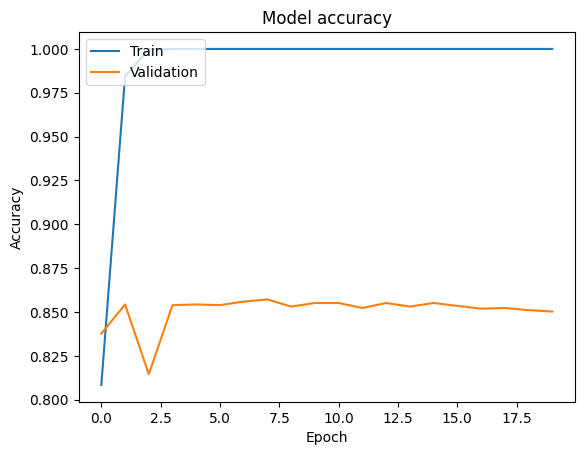

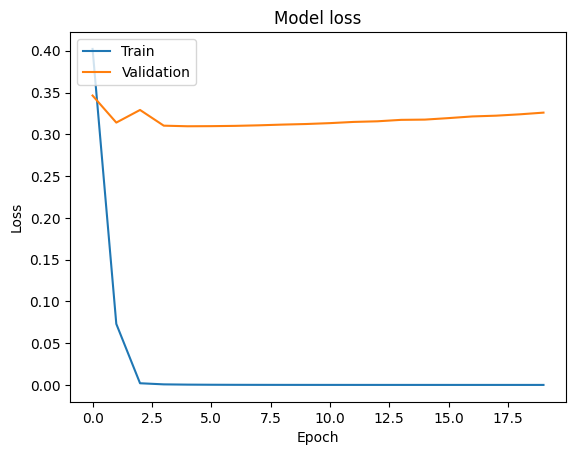

In [19]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


In [21]:
predictions = model.predict(X_test)


77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [23]:
print(predictions)


[[0.9301163 ]
 [0.9961328 ]
 [0.93222785]
 ...
 [0.54495585]
 [0.51276433]
 [0.39979205]]


In [24]:
class_predictions = (predictions > 0.5).astype(int)
print(class_predictions)


[[1]
 [1]
 [1]
 ...
 [1]
 [1]
 [0]]


In [25]:
from sklearn.metrics import accuracy_score

# Compare predictions with true labels
accuracy = accuracy_score(y_test, class_predictions)
print(f"Prediction Accuracy: {accuracy * 100:.2f}%")


Prediction Accuracy: 84.74%


In [26]:
from sklearn.metrics import precision_score, recall_score, f1_score

precision = precision_score(y_test, class_predictions)
recall = recall_score(y_test, class_predictions)
f1 = f1_score(y_test, class_predictions)

print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")


Precision: 0.83
Recall: 0.88
F1 Score: 0.86


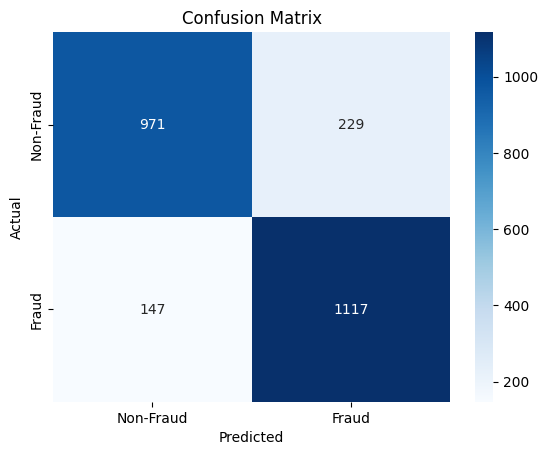

In [27]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, class_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Fraud', 'Fraud'], yticklabels=['Non-Fraud', 'Fraud'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


In [28]:
model.save('fraud_detection_model.h5')


In [29]:
model.save('fraud_detection_model.keras')


In [38]:
df = df.drop(['nameOrig', 'nameDest'], axis=1)


In [44]:
input_data = pd.DataFrame({
    'amount': [amount],
    'oldbalanceOrg': [oldbalanceOrg],
    'newbalanceOrig': [newbalanceOrig],
    'type_CASH_IN': [1 if transaction_type == 0 else 0],
    'type_CASH_OUT': [1 if transaction_type == 1 else 0],
    'type_DEBIT': [1 if transaction_type == 2 else 0],
    'type_PAYMENT': [1 if transaction_type == 3 else 0],
    'type_TRANSFER': [1 if transaction_type == 4 else 0]
}).astype('float32')


In [45]:
from tensorflow.keras.layers import Dense


In [48]:
import pandas as pd
import joblib  # or use pickle if the model is saved as a .pkl file

# Load your trained model
model_path = 'C:\\Users\\HP\\OneDrive\\Desktop\\trained_model.pkl'
model = joblib.load(model_path)

# Get the feature names from the model to ensure the input matches
expected_columns = model.feature_names_in_

# Prediction function with placeholder columns
def predict_fraud(model, amount, oldbalanceOrg, newbalanceOrig, transaction_type):
    # Define initial input data
    input_data = pd.DataFrame({
        'amount': [amount],
        'oldbalanceOrg': [oldbalanceOrg],
        'newbalanceOrig': [newbalanceOrig],
        'type_CASH_IN': [1 if transaction_type == 0 else 0],
        'type_CASH_OUT': [1 if transaction_type == 1 else 0],
        'type_DEBIT': [1 if transaction_type == 2 else 0],
        'type_PAYMENT': [1 if transaction_type == 3 else 0],
        'type_TRANSFER': [1 if transaction_type == 4 else 0]
    })

    # Add missing columns as placeholders with a value of 0
    for column in expected_columns:
        if column not in input_data.columns:
            input_data[column] = 0

    # Ensure the column order matches the model's expected order
    input_data = input_data[expected_columns]

    # Make prediction
    prediction = model.predict(input_data)
    
    # Conditional checks
    if input_data['type_CASH_OUT'][0] and amount > 10000 and newbalanceOrig == 0:
        return "Fraud"
    elif input_data['type_TRANSFER'][0] and (amount > 5000 or newbalanceOrig < oldbalanceOrg * 0.5 or newbalanceOrig == 0):
        return "Fraud"
    elif input_data['type_DEBIT'][0] and amount > oldbalanceOrg:
        return "Fraud"
    elif input_data['type_PAYMENT'][0] and newbalanceOrig < 0:
        return "Fraud"
    else:
        return "Not Fraud"

# Input values
transaction_type = int(input("Enter the transaction type code (0-CASH_IN, 1-CASH_OUT, 2-DEBIT, 3-PAYMENT, 4-TRANSFER): "))
amount = float(input("Enter transaction amount: "))
oldbalanceOrg = float(input("Enter old balance amount: "))
newbalanceOrig = float(input("Enter new balance amount: "))

# Display input
print("\nTransaction Details:")
print(f"Transaction Type: {transaction_type}")
print(f"Amount: {amount}")
print(f"Old Balance: {oldbalanceOrg}")
print(f"New Balance: {newbalanceOrig}")

# Predict and print result
result = predict_fraud(model, amount, oldbalanceOrg, newbalanceOrig, transaction_type)
print(f"\nThe transaction is: {result}")



Transaction Details:
Transaction Type: 3
Amount: 1200.0
Old Balance: 5000.0
New Balance: 3800.0


C:\Users\HP\AppData\Local\Temp\ipykernel_18716\1874976003.py:28: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  input_data[column] = 0
C:\Users\HP\AppData\Local\Temp\ipykernel_18716\1874976003.py:28: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  input_data[column] = 0
C:\Users\HP\AppData\Local\Temp\ipykernel_18716\1874976003.py:28: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(a


The transaction is: Not Fraud


In [3]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Define the model with 15 input features
model = Sequential([
    Dense(64, input_shape=(15,), activation='relu'),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
# Train the model as usual


C:\Users\HP\AppData\Roaming\Python\Python310\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [4]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input

# Define the model with an explicit Input layer
model = Sequential([
    Input(shape=(15,)),           # Specify the input shape here
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model as usual and then save it
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)
model.save('fraud_detection_model.h5')


NameError: name 'X_train' is not defined

In [5]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load the dataset
df = pd.read_csv('C:\\Users\\HP\\OneDrive\\Desktop\\Preprocessed_Online_Payment_Data.csv')

# Select features and target variable
X = df.drop(columns=['isFraud', 'nameOrig', 'nameDest'])  # Removing identifiers and the target column
y = df['isFraud']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [6]:
model.save('C:\\Users\\HP\\OneDrive\\Desktop\\fraud_detection_model.h5')


In [7]:
model.save('C:\\Users\\HP\\OneDrive\\Desktop\\fraud_detection_model.keras')
